In [1]:
import os
import re
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.sparse as sp
import time
import gget
import anndata as an
import scanpy as sc
import scanpy.external as sce
import h5py
import scipy
from scipy.stats import pearsonr
from scipy.spatial.distance import cdist
from statsmodels.stats.multitest import multipletests
from tqdm import tqdm
# import gseapy as gp
import textwrap


from scipy.spatial.distance import pdist, squareform
from collections import defaultdict

sc.settings.verbosity = 2

# Load in processed anndata

In [2]:
%%time
path = "/nfs/turbo/umms-indikar/shared/projects/hybrid_reprogramming/anndata/processed_all_groups.h5ad"
adata = sc.read_h5ad(path)

adata.uns['phase_colors'] = ['#ad3803', '#56b567', 'gold']

sc.logging.print_memory_usage()
adata

Memory usage: current 2.37 GB, difference +2.37 GB
CPU times: user 531 ms, sys: 1.94 s, total: 2.47 s
Wall time: 5.18 s


/home/jrcwycy/miniconda3/envs/rapids/lib/python3.13/site-packages/anndata/logging.py:57: FutureWarning: The specified parameters ('newline',) are no longer positional. Please specify them like `newline=False`
  print(format_memory_usage(get_memory_usage(), msg, newline))


AnnData object with n_obs × n_vars = 15950 × 25042
    obs: 'MYOD-fb_counts', 'PRRX1-fb_counts', 'PRRX1_MYOD-fb_counts', 'assigned_condition', 'total_fb_counts', 'condition_counts_rate', 'G1-fb_counts', 'G2M-fb_counts', 'S-fb_counts', 'dataset', 'total_reads', 'total_genes', 'pooled_condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'outlier', 'mt_outlier', 'S_score', 'G2M_score', 'phase', 'leiden', 'cluster_str'
    var: 'gene_id', 'gene_type', 'Chromosome', 'Start', 'End', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'filter_pass', 'highly_variable', 'highly_variable_rank', 'means', 'variance

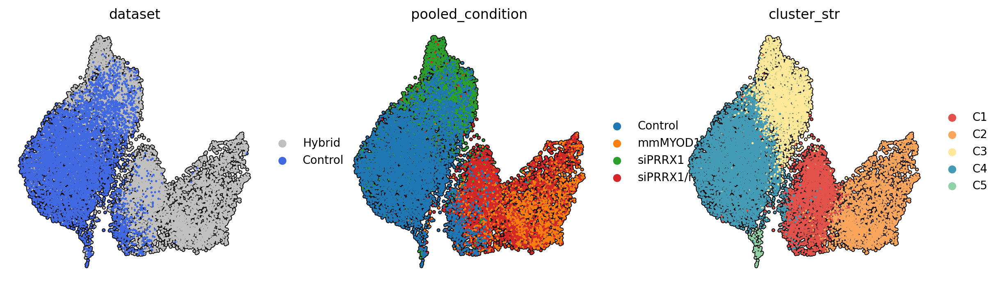

In [3]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    adata,
    color=['dataset', 'pooled_condition', 'cluster_str'],
    size=15,
    ncols=3,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    alpha=1,
)

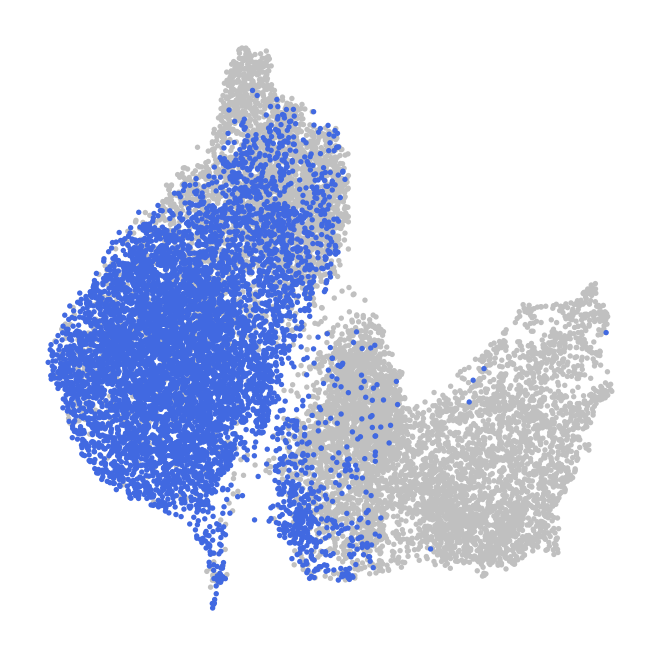

In [4]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    adata,
    color='dataset',
    size=15,
    frameon=False,
    alpha=1,
    # palette=
    title='',
    legend_loc='none',
)

# Re-clustering

## Sub-cluster by condition

Add separate clustering for HYB condition
If they end up being VERY similar to mmMYOD1 only, then can argue that's why we combined them. 

computing neighbors
    finished (0:00:06)
running Leiden clustering
    finished (0:00:00)
computing neighbors
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)
computing neighbors
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)
computing neighbors
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)


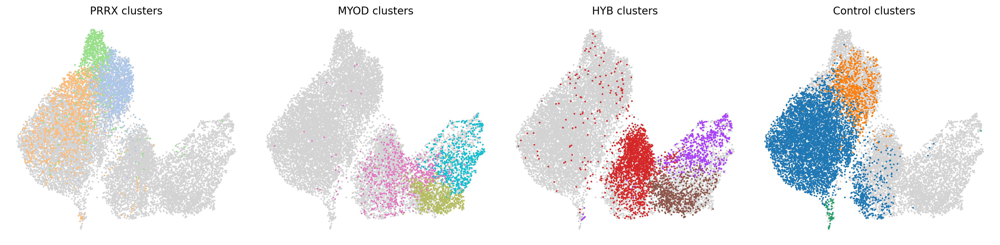

In [5]:
myod_res = 0.25
prrx_res = 0.25
hyb_res = 0.25
ctrl_res = 0.2

# Cluster mmMYOD1 cells separately from controls
subset_myod = adata[adata.obs['pooled_condition'] == 'mmMYOD1'].copy()
sc.pp.neighbors(subset_myod, n_neighbors=10, use_rep='X_pca_harmony')
sc.tl.leiden(subset_myod, resolution=myod_res, flavor='igraph')

subset_hyb = adata[adata.obs['pooled_condition'] == 'siPRRX1/mmMYOD1'].copy()
sc.pp.neighbors(subset_hyb, n_neighbors=10, use_rep='X_pca_harmony')
sc.tl.leiden(subset_hyb, resolution=hyb_res, flavor='igraph')

subset_prrx = adata[adata.obs['pooled_condition'] == 'siPRRX1'].copy()
sc.pp.neighbors(subset_prrx, n_neighbors=10, use_rep='X_pca_harmony')
sc.tl.leiden(subset_prrx, resolution=prrx_res, flavor='igraph')


subset_ctrl = adata[adata.obs['pooled_condition'] == 'Control'].copy()
sc.pp.neighbors(subset_ctrl, n_neighbors=10, use_rep='X_pca_harmony')
sc.tl.leiden(subset_ctrl, resolution=ctrl_res, flavor='igraph')



# Add back to adata as one group
adata.obs['leiden_split'] = None
adata.obs.loc[subset_myod.obs_names, 'leiden_split'] = ('M' + (subset_myod.obs['leiden'].astype(int) + 1).astype(str))
adata.obs.loc[subset_hyb.obs_names, 'leiden_split'] = ('H' + (subset_hyb.obs['leiden'].astype(int) + 1).astype(str))
adata.obs.loc[subset_prrx.obs_names, 'leiden_split'] = ('P' + (subset_prrx.obs['leiden'].astype(int) + 1).astype(str))
adata.obs.loc[subset_ctrl.obs_names, 'leiden_split'] = ('C' + (subset_ctrl.obs['leiden'].astype(int) + 1).astype(str))


# plotting 
mask_prrx = adata.obs['leiden_split'].str.startswith('P')
mask_myod = adata.obs['leiden_split'].str.startswith('M')
mask_hyb = adata.obs['leiden_split'].str.startswith('H')
mask_ctrl = adata.obs['leiden_split'].str.startswith('C')

fig, axes = plt.subplots(1, 4, figsize=(16, 4))

sc.pl.umap(
    adata,
    color='leiden_split',
    mask_obs=mask_prrx,
    size=15,
    frameon=False,
    alpha=1,
    ax=axes[0],
    show=False,
    title="PRRX clusters",
    legend_loc='none',
)

sc.pl.umap(
    adata,
    color='leiden_split',
    mask_obs=mask_myod,
    size=15,
    frameon=False,
    alpha=1,
    ax=axes[1],
    show=False,
    title="MYOD clusters",
    legend_loc='none',
)

sc.pl.umap(
    adata,
    color='leiden_split',
    mask_obs=mask_hyb,
    size=15,
    frameon=False,
    alpha=1,
    ax=axes[2],
    show=False,
    title="HYB clusters",
    legend_loc='none',
)

sc.pl.umap(
    adata,
    color='leiden_split',
    mask_obs=mask_ctrl,
    size=15,
    frameon=False,
    alpha=1,
    ax=axes[3],
    show=False,
    title="Control clusters",
    legend_loc='none',
)

plt.tight_layout()
plt.show()

['#393b79',
 '#5254a3',
 '#9c9ede',
 '#8ca252',
 '#cedb9c',
 '#bd9e39',
 '#e7ba52',
 '#843c39',
 '#d6616b',
 '#7b4173',
 '#ce6dbd',
 '#de9ed6']

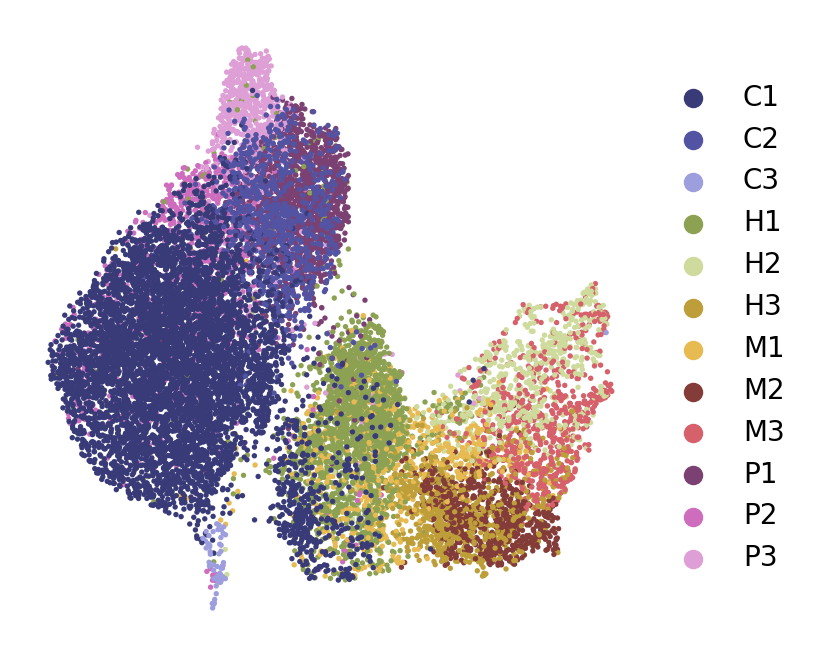

In [6]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    adata,
    color='leiden_split',
    size=15,
    frameon=False,
    alpha=1,
    palette='tab20b',
    show=False,
    title='',
    # legend_loc='on data',
)

adata.uns['leiden_split_colors'] = sc.pl.palettes.default_20 if 'leiden_split_colors' not in adata.uns else adata.uns['leiden_split_colors']
adata.uns['leiden_split_colors'] 

/tmp/ipykernel_1564795/2335846734.py:3: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.obs['leiden_split'] = adata.obs['leiden_split'].replace({'H3': 'TEMP_SWAP', 'H2': 'H3'})
/tmp/ipykernel_1564795/2335846734.py:4: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.obs['leiden_split'] = adata.obs['leiden_split'].replace('TEMP_SWAP', 'H2')
/tmp/ipykernel_1564795/2335846734.py:6: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the 

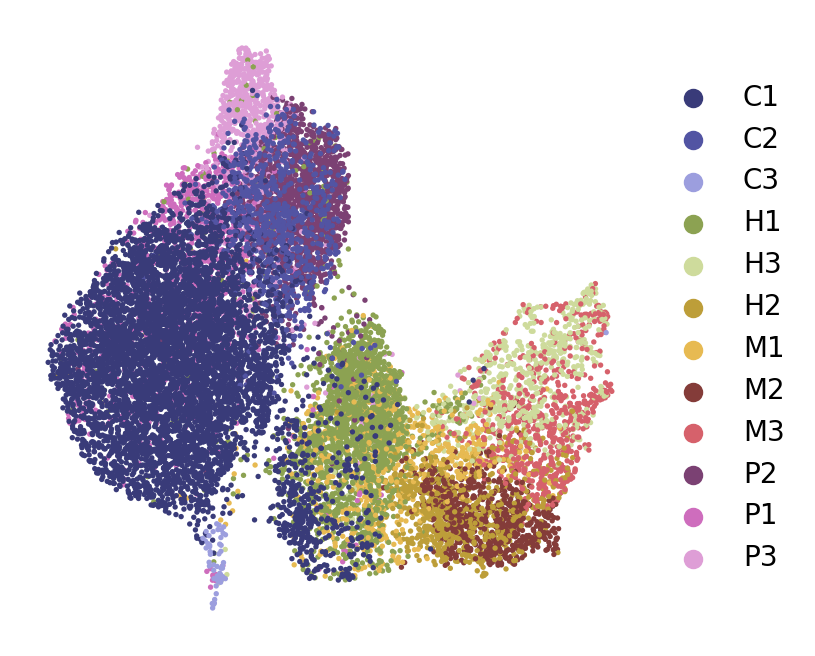

In [7]:
# adata.obs['leiden_split'] = adata.obs['leiden_split'].astype(str)

adata.obs['leiden_split'] = adata.obs['leiden_split'].replace({'H3': 'TEMP_SWAP', 'H2': 'H3'})
adata.obs['leiden_split'] = adata.obs['leiden_split'].replace('TEMP_SWAP', 'H2')

adata.obs['leiden_split'] = adata.obs['leiden_split'].replace({'P1': 'TEMP_SWAP', 'P2': 'P1'})
adata.obs['leiden_split'] = adata.obs['leiden_split'].replace('TEMP_SWAP', 'P2')

# adata.obs['leiden_split'] = adata.obs['leiden_split'].astype('category')
# sorted_categories = sorted(adata.obs['leiden_split'].unique())
# adata.obs['leiden_split'] = adata.obs['leiden_split'].cat.reorder_categories(sorted_categories)


sc.pl.umap(
    adata,
    color='leiden_split',
    size=15,
    frameon=False,
    alpha=1,
    title='',
)

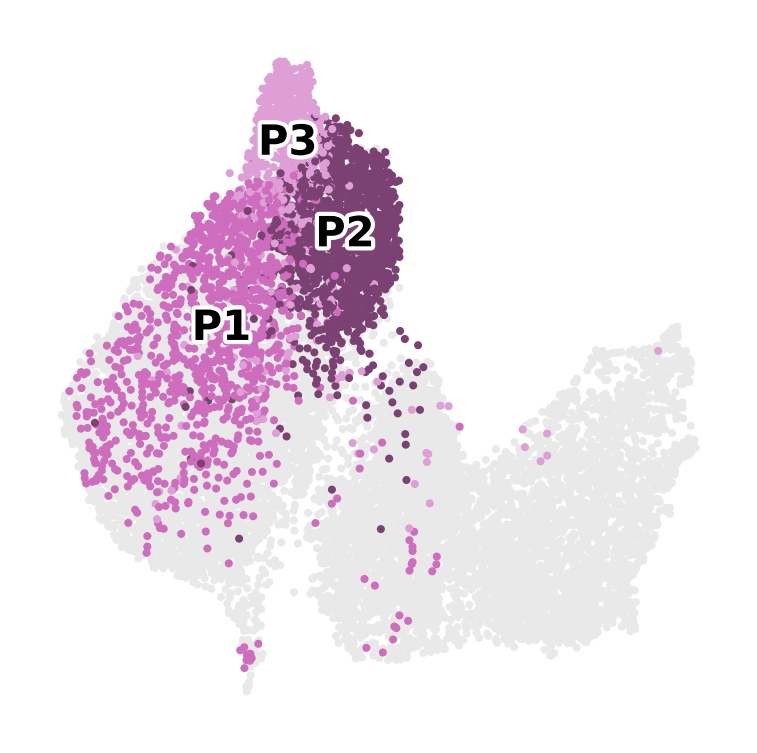

In [8]:
mask_prrx = adata.obs['leiden_split'].str.startswith('P')
mask_myod = adata.obs['leiden_split'].str.startswith('M')
mask_ctrl = adata.obs['leiden_split'].str.startswith('C')
mask_hyb = adata.obs['leiden_split'].str.startswith('H')

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 3, 3

sc.pl.umap(
    adata,
    color='leiden_split',
    mask_obs=mask_prrx,
    size=15,
    frameon=False,
    alpha=1,
    na_color='#EAE9E9',
    title='',
    legend_loc='on data',
    na_in_legend=False,
    legend_fontoutline=2,
    legend_fontsize='medium',
)

# DGE

mmMYOD1, siPRRX1, siPRRX1/mmMYOD1, Controls

In [9]:
def get_significant_DEGs(df, alpha=0.05, logfc_thresh=0.5, pct_nz_thresh=0.0):
    
    """ Filters DGE results for significant differentially expressed genes. 
    
    Params
    ------
        df (pd.DataFrame): Dataframe containing DGE results.
        alpha (float): Adjusted p-value threshold for statistical significance. Genes below this threshold are considered significant.
        logfc_thresh (float): Minimum absolute logfoldchange required for a gene to be considered significantly DE. 
        pct_nz_thresh (float): Minimum proportion of cells in the group of interest expressing the gene. Genes expressed in fewer cells than this threshold will be excluded.
    
    """
    
    tmp = df.copy()
    
    print(f"Filtering for significant DEGs (adjusted p-value < {alpha}, logfoldchange > {logfc_thresh})...")

    tmp['abs_lfc'] = tmp['logfoldchanges'].apply('abs')
    tmp = tmp[(tmp['abs_lfc'] > logfc_thresh) & (tmp['pvals_adj'] < alpha)]

    
    if pct_nz_thresh != 0.0:
        if 'pct_nz_reference' in tmp.columns:
            tmp = tmp[(tmp['pct_nz_group'] > pct_nz_thresh) | (tmp['pct_nz_reference'] > pct_nz_thresh)]
            print(f"Removed genes expressed in less than {pct_nz_thresh*100}% of cells.")
        else:
            tmp = tmp[tmp['pct_nz_group'] > pct_nz_thresh]
            print(f"Removed genes expressed in less than {pct_nz_thresh*100}% of cells.")
    
    print(f"N unique significant DEGs: {tmp['names'].nunique()}\n")
    
    return tmp

In [10]:
# all groups vs each other
sc.tl.rank_genes_groups(
    adata, 
    groupby="leiden_split",
    method='wilcoxon',
    corr_method='benjamini-hochberg',
    use_raw=False,
    layer='log_norm',
    pts=True,
    key_added='cluster_vs_rest',
)

# # hyb groups vs controls
# sc.tl.rank_genes_groups(
#     adata, 
#     groupby="pooled_condition",
#     reference='Control',
#     method='wilcoxon',
#     corr_method='benjamini-hochberg',
#     use_raw=False,
#     layer='log_norm',
#     pts=True,
#     key_added='condition_vs_control',
# )

ranking genes
    finished (0:00:46)


In [11]:
deg = sc.get.rank_genes_groups_df(
    adata, 
    group=None,
    key='cluster_vs_rest',
)

sig = get_significant_DEGs(deg, pct_nz_thresh=0.2)
sig.head()

Filtering for significant DEGs (adjusted p-value < 0.05, logfoldchange > 0.5)...
Removed genes expressed in less than 20.0% of cells.
N unique significant DEGs: 8008



,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,abs_lfc
0,C1,CST3,99.300713,2.512078,0.0,0.0,0.999671,0.782111,2.512078
1,C1,COL1A1,97.288483,2.493941,0.0,0.0,1.000000,0.948643,2.493941
2,C1,MT-ATP8,95.933510,3.503817,0.0,0.0,1.000000,0.867504,3.503817
3,C1,MT-ND4L,95.791054,4.303741,0.0,0.0,0.998848,0.472751,4.303741
4,C1,OOEP-AS1,93.904358,1.132624,0.0,0.0,1.000000,0.991187,1.132624


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_split']`


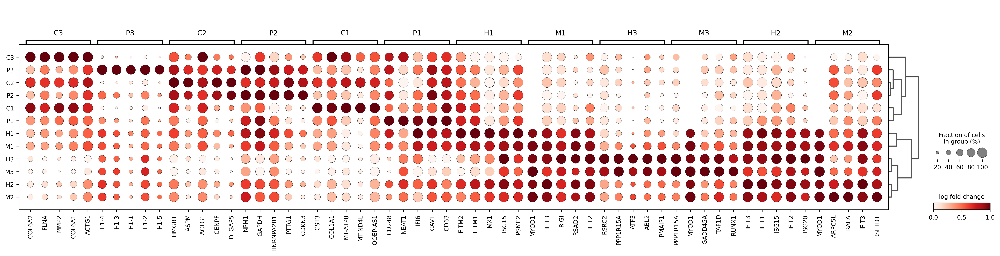

In [11]:
sc.pl.rank_genes_groups_dotplot(
    adata,
    n_genes=5,
    values_to_plot='logfoldchanges',
    standard_scale='var',
    key='cluster_vs_rest',
)

## Load in genesets

In [12]:
def load_pathway(fpath):
    result = []
    with open(fpath) as f:
        for line in f:
            split_line = [x for x in line.strip().split('\t') if x]  # Remove empty strings directly

            row = {'label': split_line[0]}
            for gene in split_line[1:]:
                row[gene] = 1

            result.append(row)

    df = pd.DataFrame(result)
    df = df.fillna(0.0).set_index('label').astype(bool).T  # Chained operations for clarity

    return df

mpath = "/nfs/turbo/umms-indikar/shared/projects/RECODE/marker_genes/PanglaoDB_Augmented_2021.txt"
pang = load_pathway(mpath)

cell_types = [
    'Fibroblasts',
    'Myocytes',
    'Myoblasts',
    'Myofibroblasts',
    'Pluripotent Stem Cells'
]

subset = pang[cell_types]

print("Marker genes per cell type:")
for ct in cell_types:
    print(f"{ct}: {subset[ct].sum()}")

panglao_markers = subset[subset.any(axis=1)]

print(f"\nTotal unique genes across selected types: {panglao_markers.shape[0]}")
panglao_markers.head()

fib_genes = panglao_markers['Fibroblasts'] == True
fib_genes =  panglao_markers[fib_genes].index
fib_genes = [g for g in fib_genes if g in adata.var_names]
print(len(fib_genes))

Marker genes per cell type:
Fibroblasts: 232
Myocytes: 163
Myoblasts: 126
Myofibroblasts: 100
Pluripotent Stem Cells: 112

Total unique genes across selected types: 563
220


In [12]:
tfpath = "../../resources/allTFs_hg38.txt"

with open(tfpath, 'r') as file:
    tf_list = [line.strip() for line in file]

print(len(tf_list))

1892


### Cell cycle genes

In [13]:
### GO biological processes
path_2023 = "../resources/GO_Biological_Process_2023.txt"
path_2025 = "/home/jrcwycy/.cache/gseapy/Enrichr.GO_Biological_Process_2025.gmt"

geneset_dict = {}

with open(path_2025, "r") as f:
    for line in f:
        parts = line.strip().split('\t')
        if len(parts) >= 1:
            term = parts[0].strip()
            genes = parts[2:] if len(parts) > 2 else []
            genes = [g.strip() for g in genes if g.strip()]
            geneset_dict[term] = genes

geneset = pd.DataFrame.from_dict(geneset_dict, orient='index').T
geneset.head()

cc_cols_to_keep = [
    # G1/S transition
    'G1/S Transition of Mitotic Cell Cycle (GO:0000082)',
    'Regulation of G1/S Transition of Mitotic Cell Cycle (GO:2000045)',
    # G2/M transition
    'G2/M Transition of Mitotic Cell Cycle (GO:0000086)',
    'Regulation of G2/M Transition of Mitotic Cell Cycle (GO:0010389)',
    # Checkpoints
    'Mitotic G1/S Transition Checkpoint Signaling (GO:0044819)',
    'Mitotic G2/M Transition Checkpoint (GO:0044818)',
]

geneset_filt = geneset[cc_cols_to_keep]
print(geneset_filt.shape)
geneset_filt.head()

geneset_filt = geneset_filt.melt(value_name='gene_name', var_name='GO_term')
geneset_filt = geneset_filt.dropna(subset=['gene_name'])

geneset_filt["transition"] = geneset_filt["GO_term"].apply(
    lambda x: "G1S_transition" if "G1/S" in x else 
              ("G2M_transition" if "G2/M" in x else None)
)

cell_cycle_df = (
    geneset_filt
    .assign(value=True)
    .pivot_table(index="gene_name", columns="transition", values="value", aggfunc='any', fill_value=False).astype(bool)
)

cell_cycle_df = cell_cycle_df.reset_index()
cell_cycle_df.columns.name = None
print(cell_cycle_df.shape)
cell_cycle_df.head()


# GO cell cycle genes from Cooper
fpath = "../../resources/human_cell_cycle_genes.csv"
cdf = pd.read_csv(fpath)
print(cdf.shape)
cdf.head()

# Merge into 1 GO df
merge_cdf = cell_cycle_df.merge(cdf, how='outer', on='gene_name')
print(merge_cdf.shape)
merge_cdf.head()


# Add regev cell cycle genes
fpath = "../../resources/regev_lab_cell_cycle_genes.txt"
regev_genes = [x.strip() for x in open(fpath)]
s_genes = regev_genes[:43]
g2m_genes = regev_genes[43:]


def add_missing_genes(df, gene_dict, gene_col='gene_name'):
    result = df.copy()
    for target_col, gene_list in gene_dict.items():
        for gene in gene_list:
            if gene in set(result[gene_col]):
                # Update existing row(s) → force target_col to True
                result.loc[result[gene_col] == gene, target_col] = True
            else:
                # Create a new row with all False except target_col
                new_row = {col: False for col in result.columns if col != gene_col}
                new_row[target_col] = True
                new_row[gene_col] = gene
                result = pd.concat([result, pd.DataFrame([new_row])], ignore_index=True)

    return result


cdf_final = add_missing_genes(
    merge_cdf,
    {'S Phase': s_genes, 'G2 Phase': g2m_genes},
)

print(cdf_final.shape)
cdf_final.head()

(2250, 6)
(270, 3)
(142, 7)
(325, 9)
(409, 9)


,gene_name,G1S_transition,G2M_transition,G1 Phase,G1/S Transition Checkpoint Signaling,G2 Phase,G2/M Transition Checkpoint Signaling,M Phase,S Phase
0,ABCB1,NaN,NaN,False,False,False,True,False,False
1,ACTL6B,True,False,NaN,NaN,NaN,NaN,NaN,NaN
2,ACVR1,True,False,NaN,NaN,NaN,NaN,NaN,NaN
3,ACVR1B,NaN,NaN,False,True,False,False,False,False
4,ADAM17,True,False,NaN,NaN,NaN,NaN,NaN,NaN


In [64]:
[col for col in geneset if 'mapk' in col.lower()]

['MAPK Cascade (GO:0000165)',
 'Negative Regulation of MAPK Cascade (GO:0043409)',
 'Negative Regulation of p38MAPK Cascade (GO:1903753)',
 'Negative Regulation of Stress-Activated MAPK Cascade (GO:0032873)',
 'p38MAPK Cascade (GO:0038066)',
 'Positive Regulation of MAPK Cascade (GO:0043410)',
 'Positive Regulation of p38MAPK Cascade (GO:1900745)',
 'Positive Regulation of Stress-Activated MAPK Cascade (GO:0032874)',
 'Regulation of MAPK Cascade (GO:0043408)',
 'Regulation of p38MAPK Cascade (GO:1900744)',
 'Regulation of Stress-Activated MAPK Cascade (GO:0032872)',
 'Stress-Activated MAPK Cascade (GO:0051403)']

In [60]:
pos_mapk = geneset['Positive Regulation of p38MAPK Cascade (GO:1900745)'].dropna().unique()
print(len(pos_mapk))
print(pos_mapk)

mapk = geneset['p38MAPK Cascade (GO:0038066)'].dropna().unique()
print(len(mapk))
print(mapk)

22
['MAP3K4' 'SPI1' 'GADD45B' 'GADD45A' 'SPHK1' 'GADD45G' 'MINK1' 'PRMT1'
 'GDF6' 'MFHAS1' 'PJA2' 'BMP4' 'IL1B' 'BMP2' 'ZC3H12A' 'HAND2' 'LEP'
 'STK39' 'RELL1' 'RELL2' 'SASH1' 'DSC3']
12
['MAPK11' 'MAP3K4' 'MAP2K3' 'ZFP36' 'ZFP36L1' 'MAP3K20' 'MAP3K7' 'MAP3K15'
 'MAP2K6' 'MAP3K5' 'MAP3K6' 'MAPK14']


In [14]:
# extract list of all cell cycle genes
cc_genes = cdf_final['gene_name'].unique()
cc_genes = [g for g in cc_genes if g in adata.var_names]
print(f"N cell cycle genes: {len(cc_genes)}")


# get just G1/S genes
G1S_genes = []

for phase in ['G1 Phase', 'G1S_transition', 'S Phase']:
    genes_in_col = cdf_final.loc[cdf_final[phase].astype(bool), 'gene_name'].tolist()
    G1S_genes.extend(genes_in_col)

G1S_genes = list(set(G1S_genes)) # keep only unique genes
G1S_genes = [g for g in G1S_genes if g in adata.var_names]
print(f"N G1/S phase genes: {len(G1S_genes)}")
    
# get just G2/M genes
G2M_genes = []

for phase in ['G2 Phase', 'G2M_transition', 'M Phase']:
    genes_in_col = cdf_final.loc[cdf_final[phase].astype(bool), 'gene_name'].tolist()
    G2M_genes.extend(genes_in_col)

G2M_genes = list(set(G2M_genes)) # keep only unique genes
G2M_genes = [g for g in G2M_genes if g in adata.var_names]
print(f"N G2/M phase genes: {len(G2M_genes)}")

N cell cycle genes: 374
N G1/S phase genes: 299
N G2/M phase genes: 300


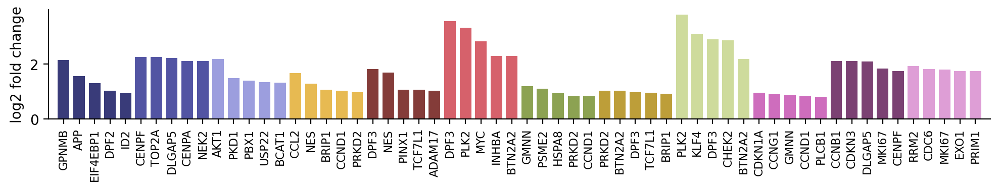

In [53]:
# df = sig[sig['names'].isin(tf_list)]
df = sig[sig['names'].isin(cc_genes)]
n = 5

down = False

cluster_order = ["C1","C2","C3",
                 "M1","M2","M3",
                 "H1","H2","H3",
                 "P1","P2","P3"]

top_genes = []
for cluster in cluster_order:
    sub = df[df['group'] == cluster].sort_values('logfoldchanges', ascending=down).head(n)
    top_genes.append(sub.assign(group=cluster))  # enforce group name
plot_df = pd.concat(top_genes).reset_index(drop=True)


plot_df['label'] = plot_df['group'] + "_" + plot_df['names']

categories = list(adata.obs['leiden_split'].cat.categories)
colors = adata.uns['leiden_split_colors']
cluster_colors = dict(zip(categories, colors))


plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 10, 2

plt.bar(
    x=range(len(plot_df)),
    height=plot_df['logfoldchanges'],
    width=0.75,
    color=plot_df['group'].map(cluster_colors)
)

plt.xticks(
    ticks=range(len(plot_df)),
    labels=plot_df['names'],
    rotation=90,
    fontsize=8
)

plt.margins(x=0.01)


plt.ylabel("log2 fold change")
plt.xlabel("")


sns.despine()
plt.tight_layout()
plt.show()

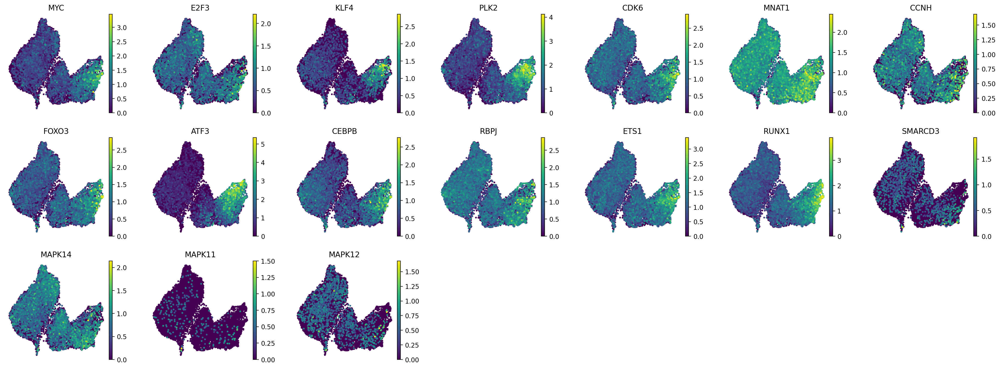

In [67]:
# goal: show opposing signal in H3/M3, e.g. upregulation of proliferative signals and also upregulation of quiesence genes
genes_to_plot = [
    # proliferative/cycling genes
    'MYC', 'E2F3', 'KLF4', 'PLK2', 'CDK6', 'MNAT1', 'CCNH',
    
    # quiescence genes
    'FOXO3', 'ATF3', 'CEBPB', 'RBPJ', 'ETS1', 'RUNX1',
    
    'SMARCD3', 'MAPK14', 'MAPK11', 'MAPK12',
]

genes_to_plot = [g for g in genes_to_plot if g in adata.var_names]

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3, 3

sc.pl.umap(
    adata,
    color=genes_to_plot,
    ncols=7,
    size=30,
    frameon=False,
    alpha=1,
    layer='log_norm',
)

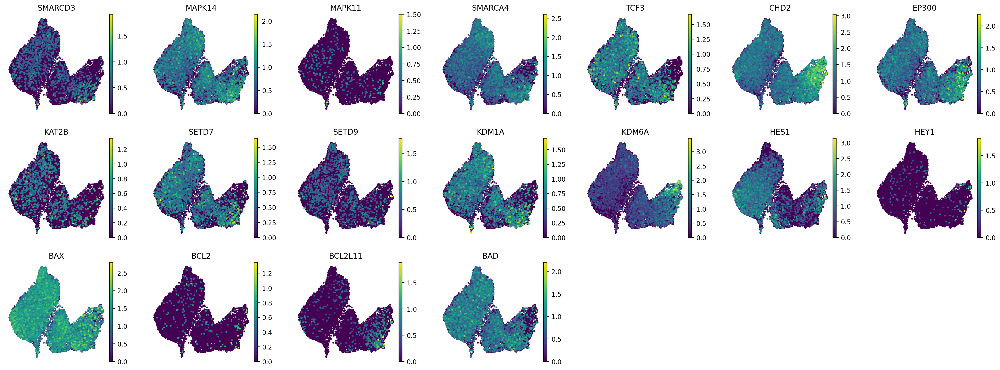

In [93]:
genes_to_plot = [
    'SMARCD3', 'MAPK14', 'MAPK11', 'SMARCA4', # SWI/SNF: BAF60c, p38a, p38b, BRG1
    'TCF3', 
    'CHD2', 'EP300', 'KAT3A', 'KAT2B', 'SETD7', 'SETD9', 'KDM1A', 'KDM6A', 
    'HES1', 'HEY1', # should be down
    
    
    'BAX', 'BCL2', 'BCL2L11', 'BAD',
]

genes_to_plot = [g for g in genes_to_plot if g in adata.var_names]

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3, 3

sc.pl.umap(
    adata,
    color=genes_to_plot,
    ncols=7,
    size=30,
    frameon=False,
    alpha=1,
    layer='log_norm',
)

In [54]:
direction = 'upregulated'

# Subset by direction
if direction.lower() == 'upregulated':
    tmp = df[df['logfoldchanges'] > 0]
else:
    tmp = df[df['logfoldchanges'] < 0]

tmp = tmp.sort_values(by=['group', 'names'])

clusters = tmp['group'].unique()

for clust in sorted(clusters):
    print(f"\n{clust} {direction} genes:")
    
    # Genes in this cluster
    clust_genes = set(tmp[tmp['group'] == clust]['names'])
    
    # Genes in all other clusters
    other_genes = set(tmp[tmp['group'] != clust]['names'])
    
    # Unique to this cluster
    unique_genes = clust_genes - other_genes
    print(f"  Unique to {clust}: {sorted(unique_genes)}")
    
    # Optional: shared with other clusters (pairwise or all)
    shared_genes = clust_genes & other_genes
    print(f"  Shared with other clusters: {sorted(shared_genes)}")


C1 upregulated genes:
  Unique to C1: ['EIF4EBP1', 'ID2', 'UXT']
  Shared with other clusters: ['APP', 'APPL1', 'CCNI', 'CENPA', 'DPF2', 'GPNMB', 'ITGB1', 'JADE1', 'PBX1', 'PKD1', 'RB1', 'RDX', 'UBE2C']

C2 upregulated genes:
  Unique to C2: ['ARPP19', 'BCL7C', 'CALM2', 'CDK5RAP3', 'CDKN2D', 'EIF4E', 'FZR1', 'RCC2']
  Shared with other clusters: ['ANLN', 'ANP32E', 'APP', 'APPL1', 'ATAD2', 'AURKA', 'AURKB', 'BIRC5', 'BRCA1', 'BUB1', 'CALM3', 'CBX5', 'CCNA2', 'CCNB1', 'CCNB2', 'CCNF', 'CDC20', 'CDC25B', 'CDC25C', 'CDC7', 'CDCA2', 'CDCA3', 'CDCA7', 'CDCA8', 'CDK1', 'CDK2', 'CDK2AP2', 'CDKN2C', 'CDKN3', 'CENPA', 'CENPE', 'CENPF', 'CHEK1', 'CKAP2', 'CKAP2L', 'CKAP5', 'CKS1B', 'CKS2', 'CLSPN', 'CTCF', 'DBF4', 'DLGAP5', 'DONSON', 'DPF2', 'E2F8', 'ECT2', 'EZH2', 'FBXO5', 'FOXM1', 'G2E3', 'GAS2L3', 'GSPT1', 'GTSE1', 'HELLS', 'HJURP', 'HMGB2', 'HMMR', 'IQGAP3', 'ITGB1', 'JADE1', 'KHDRBS1', 'KIF11', 'KIF14', 'KIF20B', 'KIF23', 'KIF2C', 'LBR', 'MCM4', 'MELK', 'MKI67', 'MRE11', 'MSH2', 'NCAPD2', '

(19, 12)


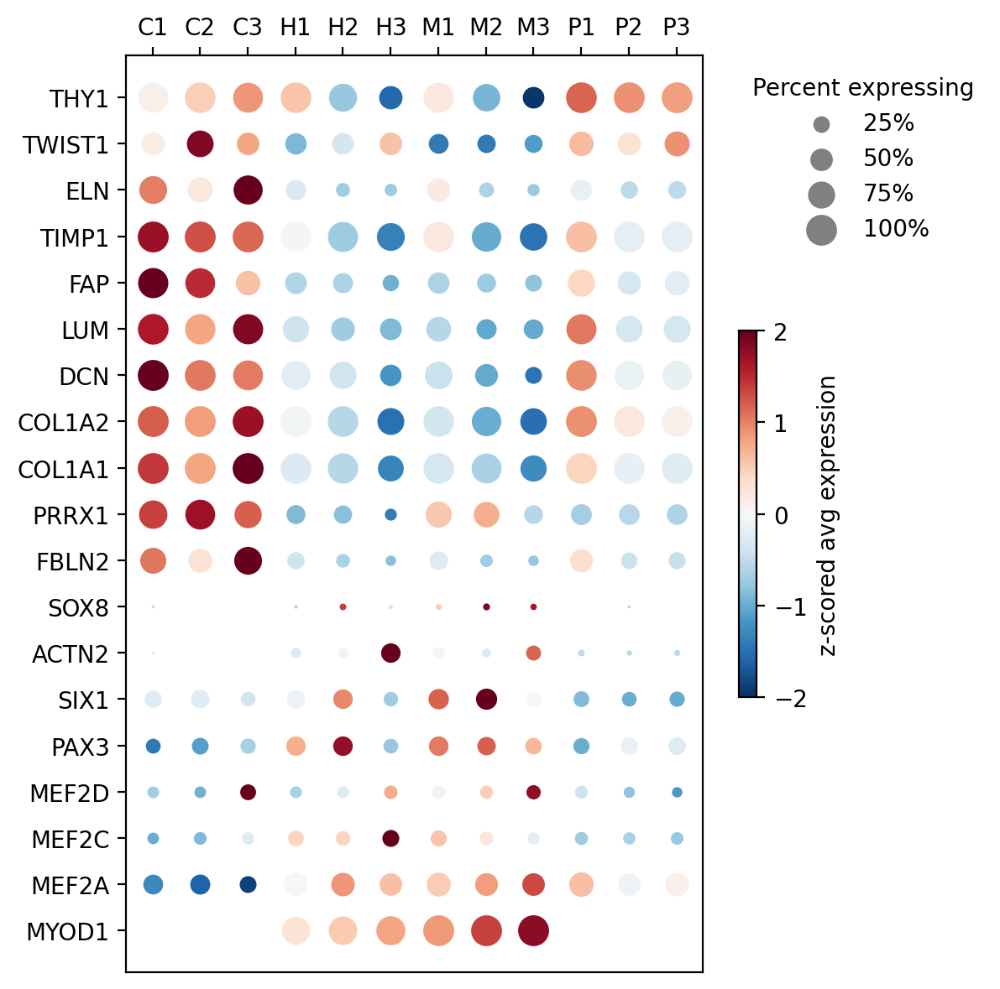

In [80]:
genes = [
    'MYOD1', 'MEF2A', 'MEF2C', 'MEF2D', 'PAX3', 'SIX1', 'ACTN2',
    'SOX8', 'TNNT3', 'TNNI1',
    'FBLN2',
    'PRRX1', 'COL1A1', 'COL1A2', 'DCN', 'LUM', 'FAP', 'TIMP1', 'ELN', 'TWIST1', 'THY1', 
]

genes_to_plot = [g for g in genes if g in adata.var_names]

groups = adata.obs['leiden_split'].unique()
groups = sorted(groups)

avg_expr = pd.DataFrame(index=genes_to_plot, columns=groups)
pct_expr = pd.DataFrame(index=genes_to_plot, columns=groups)

adata.X = adata.layers['log_norm'].copy()

for g in groups:
    cells = adata.obs['leiden_split'] == g
    data = adata[cells, genes_to_plot].X
    # If sparse matrix
    if not isinstance(data, np.ndarray):
        data = data.toarray()
    avg_expr[g] = data.mean(axis=0)
    pct_expr[g] = (data > 0).mean(axis=0) * 100

# Z-score by gene
avg_expr = avg_expr.T   
avg_expr_z = avg_expr.apply(scipy.stats.zscore, axis=0)
avg_expr_z = avg_expr_z.T

print(avg_expr_z.shape)
avg_expr_z.head()  

cmap = 'RdBu_r'
size_scale = 1.5

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 6, 6
fig, ax = plt.subplots()

for i, gene in enumerate(genes_to_plot):
    for j, cluster in enumerate(groups):
        size = float(pct_expr.loc[gene, cluster])*size_scale
        color = float(avg_expr_z.loc[gene, cluster])
        
        ax.scatter(
            x=j, 
            y=i, 
            s=size, 
            c=[color], 
            cmap=cmap,
            vmin=-2, 
            vmax=2, 
        )
        
ax.set_yticks(range(len(genes_to_plot)))
ax.set_yticklabels(genes_to_plot)
ax.set_xticks(range(len(groups)))
ax.set_xticklabels(groups)
ax.xaxis.set_label_position('top') 
ax.xaxis.tick_top()
ax.set_xlabel('')

sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=-2, vmax=2))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, shrink=0.4, pad=0.05)
cbar.set_label('z-scored avg expression')


sizes = [25, 50, 75, 100]
markers = [plt.scatter([], [], s=s*size_scale, color='gray') for s in sizes]
labels = [f"{s}%" for s in sizes]

ax.legend(markers, labels, title="Percent expressing", scatterpoints=1,
          frameon=False, bbox_to_anchor=(1.05, 1), loc='upper left')


plt.tight_layout()
plt.show()

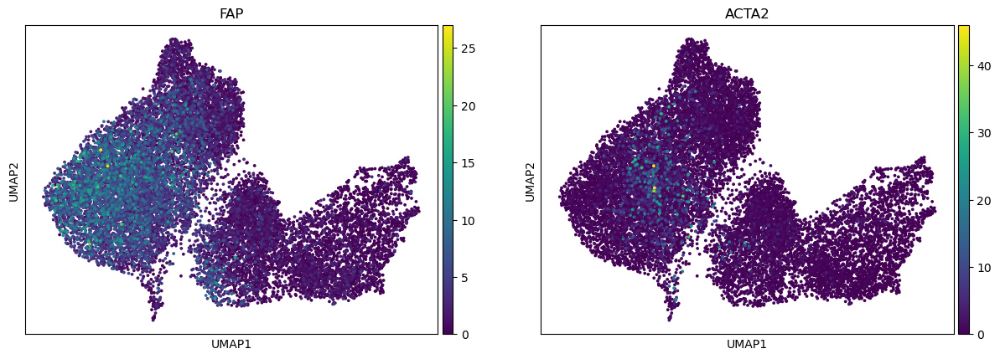

In [20]:
plt.rcdefaults()

sc.pl.umap(
    adata,
    color=['FAP', 'ACTA2'],
    size=30,
)

In [17]:
group = 'P3'

tmp = sig[sig['group'] == group]

tmp.sort_values(by='logfoldchanges', ascending=False).head(20)

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,abs_lfc
275463,P3,H1-3,39.660931,4.269323,0.000000e+00,0.000000e+00,0.944444,0.357312,4.269323
275464,P3,H1-1,37.767914,4.097057,0.000000e+00,0.000000e+00,0.900794,0.278860,4.097057
275472,P3,H2AC12,32.982040,3.974180,1.469761e-238,3.345977e-235,0.775132,0.117481,3.974180
275466,P3,H1-5,37.696594,3.859806,0.000000e+00,0.000000e+00,0.895503,0.243649,3.859806
275467,P3,H2AC14,37.603737,3.837242,1.867541e-309,7.794495e-306,0.894180,0.243188,3.837242
275462,P3,H1-4,40.474850,3.742486,0.000000e+00,0.000000e+00,0.985450,0.530407,3.742486
275671,P3,H2AC13,15.899529,3.312371,6.384380e-57,5.792668e-55,0.387566,0.049098,3.312371
275469,P3,H2AC17,34.327702,3.294951,3.030783e-258,9.487107e-255,0.858466,0.212847,3.294951
275499,P3,H3C8,23.378756,2.760619,7.030433e-121,3.827307e-118,0.612434,0.120837,2.760619
275470,P3,H2AC20,33.401413,2.744300,1.307683e-244,3.638556e-241,0.883598,0.374687,2.744300


## enrichr

In [48]:
gdf = adata.var[['gene_type', 'mt', 'ribo']].copy()
gdf = gdf.reset_index(names='names')

pdf = pd.merge(sig, gdf, how='left', on='names')

print("Removing non protein-coding, unnamed, and mitochondrial genes...\n")

pdf = pdf[pdf['gene_type'] == 'protein_coding'] # get only protein-coding genes
pdf = pdf[~pdf['names'].str.startswith(('ENSG', 'MT-'))] # remove unnamed and MT genes
# pdf = pdf[~pdf['ribo']] # remove ribosomal genes

print(f"N unique DE protein-coding genes: {pdf['names'].nunique()}\n")

# for i in pdf['group'].unique():
#     tmp = pdf[pdf['group'] == i]
#     print(f"N upregulated genes for {i}: {tmp[tmp['logfoldchanges'] > 0]['names'].nunique()}")
#     print(f"N downregulated genes for {i}: {tmp[tmp['logfoldchanges'] < 0]['names'].nunique()}\n")

pdf.head()

Removing non protein-coding, unnamed, and mitochondrial genes...

N unique DE protein-coding genes: 7387



,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,abs_lfc,gene_type,mt,ribo
0,C1,CST3,99.300713,2.512078,0.0,0.0,0.999671,0.782111,2.512078,protein_coding,False,False
1,C1,COL1A1,97.288483,2.493941,0.0,0.0,1.000000,0.948643,2.493941,protein_coding,False,False
5,C1,RPLP1,92.814415,0.949016,0.0,0.0,1.000000,0.998278,0.949016,protein_coding,False,True
7,C1,TIMP1,91.157974,2.474152,0.0,0.0,1.000000,0.959380,2.474152,protein_coding,False,False
8,C1,COL6A2,90.685226,2.377152,0.0,0.0,0.997861,0.725790,2.377152,protein_coding,False,False


12:17:59 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2025.
12:18:00 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2025.
12:18:00 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2025.
12:18:00 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2025.
12:18:01 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2025.
12:18:01 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2025.
12:18:01 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2025.
12:18:02 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2025.
12:18:02 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2025.
12:18:02 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2025.
12:18:03 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2025.
12:18:03 - INFO - Per

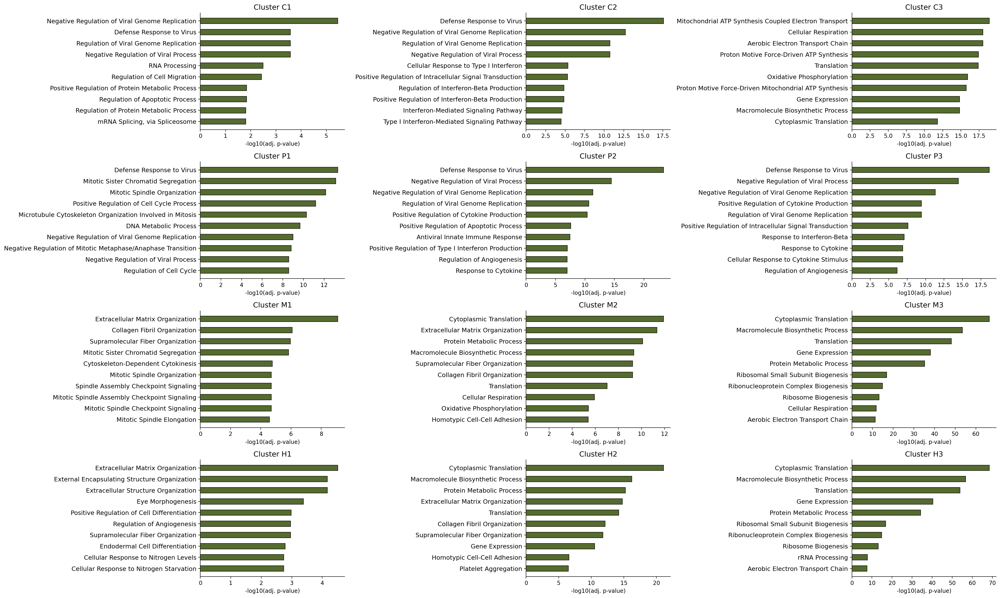

In [69]:
# groups = [
#     'C1', 'P1', 'M1', 'H1',
#     'C2', 'P2', 'M2', 'H2',
#     'C3', 'P3', 'M3', 'H3',
# ]

groups = ['C1','C2', 'C3', 'P1', 'P2', 'P3', 'M1', 'M2', 'M3', 'H1', 'H2', 'H3']

n_genes = 300
n_terms = 10
database = "GO_Biological_Process_2025"

direction = 'down'
sort_col = 'scores'

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 25, 15
fig, axes = plt.subplots(4, 3)
axes = axes.flatten()

for i, cond in enumerate(groups):
    if direction == 'up':
        tmp = sig[sig['logfoldchanges'] > 0]
        tmp = tmp[tmp['group'] == cond].sort_values(by=sort_col, ascending=False)
        
    elif direction == 'down':
        tmp = sig[sig['logfoldchanges'] < 0]
        tmp = tmp[tmp['group'] == cond].sort_values(by=sort_col, ascending=True)
    
    # tmp = tmp[tmp['group'] == cond].sort_values(by='logfoldchanges', ascending=False)
    gene_list = tmp['names'].unique()[:n_genes]

    enr = gget.enrichr(gene_list, database, save=False)

    top_terms = enr[['path_name', 'adj_p_val']].head(n_terms).copy()
    # Remove IDs in parentheses from path names
    top_terms['path_name'] = top_terms['path_name'].apply(lambda x: re.sub(r"\s*\(.*\)", "", x))
    top_terms['neglog10_p'] = -np.log10(top_terms['adj_p_val'])

    colors = ["darkolivegreen" if p <= 0.05 else "lemonchiffon" for p in top_terms['adj_p_val']]
    
    ax = axes[i]
    ax.barh(
        top_terms['path_name'][::-1],
        top_terms['neglog10_p'][::-1],
        color=colors[::-1],
        height=0.5,
        edgecolor='k',
        linewidth=0.75,
    )
    
    ax.set_title(f"Cluster {cond}", fontsize=13)
    ax.set_xlabel("-log10(adj. p-value)")
    ax.set_ylabel("")  
    ax.tick_params(axis='y', labelsize=11)

sns.despine()
plt.tight_layout()
plt.show()

In [19]:
# pd.set_option('display.max_colwidth', None)

groups = ['C1','C2', 'C3', 'P1', 'P2', 'P3', 'M1', 'M2', 'M3', 'H1', 'H2', 'H3']

n_genes = 200
database = "GO_Biological_Process_2025"
# database="Reactome_Pathways_2024"
# database="KEGG_2021_Human"
# database='MSigDB_Hallmark_2020' 

for cond in groups:
    tmp = sig[sig['group'] == cond]
    tmp = tmp.sort_values(by='logfoldchanges', ascending=False)
    
    gene_list = tmp['names'].unique()[:n_genes]

    enr = gget.enrichr(
        gene_list,
        database,
        save=False,
    )
    
    print(f"Cluster {cond}:")
    display(enr[['path_name', 'overlapping_genes', 'adj_p_val']].head(10))
    print("=" * 100 + "\n")
    
    # break

11:59:59 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2025.


Cluster C1:


,path_name,overlapping_genes,adj_p_val
0,Extracellular Matrix Organization (GO:0030198),"[APP, POSTN, COL15A1, COL16A1, LUM, MMP2, MMP3...",1.474934e-14
1,Supramolecular Fiber Organization (GO:0097435),"[APP, TPM4, LUM, TPM1, LMOD1, FURIN, LTBP3, KR...",3.906953e-10
2,External Encapsulating Structure Organization ...,"[APP, POSTN, COL15A1, COL16A1, MMP2, MMP3, FUR...",2.172904e-09
3,Extracellular Structure Organization (GO:0043062),"[APP, POSTN, COL15A1, COL16A1, MMP2, MMP3, FUR...",2.172904e-09
4,Collagen Fibril Organization (GO:0030199),"[COL1A1, GREM1, COL3A1, COL1A2, COL5A1, LOX, L...",1.657353e-07
5,Proteolysis (GO:0006508),"[CTSA, CPQ, MMP2, MMP3, HTRA1, PCOLCE, FURIN, ...",2.247636e-04
6,Skin Development (GO:0043588),"[COL1A1, COL3A1, COL1A2, COL5A1, COL5A3, WNT5A...",1.255667e-03
7,Regulation of Angiogenesis (GO:0045765),"[GRN, SPARC, GPNMB, COL4A2, RRAS, SERPINF1, WN...",1.807947e-03
8,Collagen Catabolic Process (GO:0030574),"[CTSK, MMP2, MMP3, FURIN, CTSB]",2.137425e-03
9,Negative Regulation of Protein Catabolic Proce...,"[CST3, CTSA, TIMP2, FLNA, FURIN, TIMP1]",2.137425e-03


12:00:00 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2025.



Cluster C2:


,path_name,overlapping_genes,adj_p_val
0,Mitotic Sister Chromatid Segregation (GO:0000070),"[KIF14, CDCA8, NCAPG, KIF11, SMC4, CCNB1, NUSA...",3.167074e-29
1,Mitotic Spindle Organization (GO:0007052),"[GPSM2, SUN2, PLK1, CDCA8, KIF23, TTK, KIF11, ...",1.209150e-23
2,Positive Regulation of Cell Cycle Process (GO:...,"[GPSM2, RANBP1, RRM1, SPAG5, KIF14, CDCA8, NCA...",8.684018e-21
3,Microtubule Cytoskeleton Organization Involved...,"[GPSM2, SUN2, PLK1, TTK, KIF11, CKAP5, NDC80, ...",5.201279e-20
4,Spindle Assembly Checkpoint Signaling (GO:0071...,"[CDC20, CENPF, NUF2, PLK1, BUB1B, BIRC5, TTK, ...",1.563447e-15
5,Mitotic Spindle Assembly Checkpoint Signaling ...,"[CDC20, CENPF, NUF2, PLK1, BUB1B, BIRC5, TTK, ...",1.563447e-15
6,Mitotic Spindle Checkpoint Signaling (GO:0071174),"[CDC20, CENPF, NUF2, PLK1, BUB1B, BIRC5, TTK, ...",1.563447e-15
7,Mitotic Nuclear Division (GO:0140014),"[SPAG5, UBE2C, NDE1, PLK1, KNL1, SMC4, KNSTRN,...",2.021926e-15
8,Negative Regulation of Mitotic Metaphase/Anaph...,"[CDC20, CENPF, NUF2, PLK1, BUB1B, BIRC5, TTK, ...",3.567545e-15
9,Mitotic Cytokinesis (GO:0000281),"[PLK1, CKAP2, CDCA8, KIF23, CENPA, ANLN, RACGA...",3.629864e-15


12:00:00 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2025.



Cluster C3:


,path_name,overlapping_genes,adj_p_val
0,Collagen Fibril Organization (GO:0030199),"[COL1A1, CRTAP, COL3A1, BMP1, COL1A2, COL5A1, ...",2.808324e-08
1,Extracellular Matrix Organization (GO:0030198),"[CRTAP, COL16A1, MMP2, LOXL3, LOXL2, COL1A1, C...",3.359210e-08
2,Endodermal Cell Differentiation (GO:0035987),"[ITGB5, COL4A2, MMP2, COL6A1, FN1, ITGAV, ITGA5]",1.222358e-05
3,Supramolecular Fiber Organization (GO:0097435),"[CRTAP, ACTN1, LOXL3, LTBP3, FBLN5, LOXL2, COL...",1.758438e-05
4,Endoderm Formation (GO:0001706),"[ITGB5, COL4A2, MMP2, COL6A1, FN1, ITGAV, ITGA5]",1.758438e-05
5,Integrin-Mediated Signaling Pathway (GO:0007229),"[COL3A1, COL16A1, ITGB5, FN1, ZYX, MYH9, ITGAV...",4.926462e-05
6,"Wound Healing, Spreading of Epidermal Cells (G...","[COL5A1, ITGB5, ITGAV, ITGA5]",9.640681e-04
7,"Wound Healing, Spreading of Cells (GO:0044319)","[ITGB5, COL5A1, FLNA, ITGAV, ITGA5]",1.200540e-03
8,Positive Regulation of Cell-Substrate Adhesion...,"[MYADM, FN1, FLNA, FBLN1, P4HB, FBLN2, LIMS2]",1.395231e-03
9,Cell-Matrix Adhesion (GO:0007160),"[COL3A1, ITGB5, FN1, ZYX, EMILIN1, ITGAV, ITGA...",1.818495e-03


12:00:00 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2025.



Cluster P1:


,path_name,overlapping_genes,adj_p_val
0,Supramolecular Fiber Organization (GO:0097435),"[CLIP3, MYO1D, CEP126, KRT19, GSN, RHOJ, MDM2,...",0.168472
1,Cilium Assembly (GO:0060271),"[CEP126, EHD3, GSN, TBC1D32, ARMC9, BBS9, B9D1...",0.231518
2,Amino-Acid Betaine Metabolic Process (GO:0006577),"[BHMT2, CROT]",0.231518
3,Smooth Muscle Cell Migration (GO:0014909),"[CCN3, PLAT]",0.231518
4,Positive Regulation of Protein Phosphorylation...,"[CLIP3, LIMCH1, FAXDC2, NEK10, MAPRE3, TNIK, E...",0.231518
5,Regulation of Smoothened Signaling Pathway (GO...,"[SFRP1, ARMC9, FBXL17, RORA]",0.231518
6,Plasma Membrane Bounded Cell Projection Assemb...,"[CEP126, EHD3, GSN, ARMC9, BBS9, B9D1, TNIK, S...",0.231518
7,Positive Regulation of Epithelial Cell Apoptot...,"[GSN, PLA2R1]",0.231518
8,Protein Depolymerization (GO:0051261),"[GSN, STMN2, NCKAP5]",0.231518
9,Cilium Organization (GO:0044782),"[CEP126, EHD3, GSN, ARMC9, BBS9, B9D1, SSX2IP,...",0.231518


12:00:00 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2025.



Cluster P2:


,path_name,overlapping_genes,adj_p_val
0,Mitotic Sister Chromatid Segregation (GO:0000070),"[SPAG5, PLK1, NCAPG2, KIF14, CDCA8, KNL1, KIF1...",1.334324e-21
1,Mitotic Spindle Organization (GO:0007052),"[GPSM2, PLK1, CDCA8, KIF11, WDR62, CKAP5, MZT1...",6.077175e-19
2,Microtubule Cytoskeleton Organization Involved...,"[GPSM2, PLK1, KIF11, WDR62, CKAP5, NDC80, CENP...",1.576804e-16
3,Metaphase Chromosome Alignment (GO:0051310),"[CENPE, CCNB1, CENPF, PSRC1, GMNN, KIF14, CDCA...",1.785001e-09
4,Positive Regulation of Cell Cycle Process (GO:...,"[GPSM2, SPAG5, NCAPG2, KIF14, CDCA8, KNL1, SMC...",3.444429e-09
5,Mitotic Cytokinesis (GO:0000281),"[ANLN, RACGAP1, KIF4A, STMN1, PLK1, NUSAP1, CK...",4.756514e-09
6,Mitotic Nuclear Division (GO:0140014),"[SPAG5, NDE1, NCAPG2, PLK1, NUSAP1, KNL1, SMC4...",4.941123e-09
7,Sister Chromatid Segregation (GO:0000819),"[SPAG5, NCAPG2, PLK1, NUSAP1, KNL1, SMC4, KNST...",8.983266e-09
8,Spindle Assembly Checkpoint Signaling (GO:0071...,"[CDC20, CENPF, NUF2, PLK1, BUB1B, BIRC5, BUB1,...",1.720995e-08
9,Mitotic Spindle Assembly Checkpoint Signaling ...,"[CDC20, CENPF, NUF2, PLK1, BUB1B, BIRC5, BUB1,...",1.720995e-08


12:00:01 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2025.



Cluster P3:


,path_name,overlapping_genes,adj_p_val
0,DNA Metabolic Process (GO:0006259),"[TOP2A, BLM, FEN1, ERCC6L, RNASEH2A, MCM7, MCM...",5.538027e-33
1,DNA Replication (GO:0006260),"[RFC5, WDHD1, FEN1, RFC3, BLM, RFC4, RNASEH2A,...",4.076546e-26
2,DNA-templated DNA Replication (GO:0006261),"[RFC5, WDHD1, RFC3, RRM1, RFC4, MCM7, RFC2, PR...",3.804977e-24
3,DNA Repair (GO:0006281),"[BLM, FEN1, ERCC6L, PCNA, RNASEH2A, CDCA5, BRC...",2.587008e-21
4,DNA Damage Response (GO:0006974),"[TOP2A, BLM, FEN1, ERCC6L, MCM7, MCM8, MCM10, ...",4.502839e-15
5,Chromosome Condensation (GO:0030261),"[TOP2A, H1-5, H1-4, CDCA5, NUSAP1, NCAPG, NCAP...",1.156050e-14
6,DNA Strand Elongation Involved in DNA Replicat...,"[POLD3, POLA1, RFC3, PCNA, RFC4, MCM7, MCM3, M...",2.069012e-14
7,Double-Strand Break Repair via Homologous Reco...,"[GINS2, BLM, FEN1, MCM7, MCM8, XRCC2, GINS4, C...",1.619048e-13
8,Double-Strand Break Repair via Break-Induced R...,"[GINS2, MCM7, GINS4, MCM3, MCM4, CDC7, MCM5, M...",3.140619e-13
9,Mitotic Sister Chromatid Segregation (GO:0000070),"[CDCA5, NCAPG2, NCAPG, KIF11, SKA3, SMC4, NCAP...",3.140619e-13


12:00:01 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2025.



Cluster M1:


,path_name,overlapping_genes,adj_p_val
0,Defense Response to Virus (GO:0051607),"[RSAD2, APOBEC3G, MLKL, DDX60L, IFIT1, IFIT3, ...",9.462544e-14
1,Negative Regulation of Viral Genome Replicatio...,"[IFIH1, BST2, ISG20, APOBEC3G, RSAD2, OAS1, TN...",1.989508e-08
2,Regulation of Viral Genome Replication (GO:004...,"[IFIH1, BST2, ISG20, CXCL8, RSAD2, OAS1, APOBE...",1.989508e-08
3,Negative Regulation of Viral Process (GO:0048525),"[IFIH1, IL32, BST2, ISG20, RSAD2, OAS1, APOBEC...",1.989508e-08
4,Cellular Response to Tumor Necrosis Factor (GO...,"[NFKBIA, CXCL8, PID1, AIM2, CCL5, CCL2, HAS2, ...",2.085586e-08
5,Cellular Response to Lipid (GO:0071396),"[CD274, CXCL8, PID1, TNFAIP3, ESR1, AREG, NFKB...",5.162639e-08
6,Cellular Response to Interleukin-1 (GO:0071347),"[NFKBIA, CXCL8, IL1B, CCL5, CCL2, HAS2, SOX9, ...",5.162639e-08
7,Cellular Response to Lipopolysaccharide (GO:00...,"[CD274, CXCL8, TNFAIP3, NFKB1, CXCL10, IL6, TN...",7.659639e-08
8,Cellular Response to Molecule of Bacterial Ori...,"[CD274, CXCL10, IL6, CXCL8, TNIP1, IL1B, PDE4B...",6.866954e-07
9,Response to Interleukin-1 (GO:0070555),"[CXCL8, IL1B, CCL5, CCL2, HAS2, SOX9, GBP2, GB...",1.074905e-06


12:00:01 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2025.



Cluster M2:


,path_name,overlapping_genes,adj_p_val
0,Ribosome Biogenesis (GO:0042254),"[EXOSC4, NOP16, NOB1, GRWD1, PAK1IP1, RRS1, NO...",0.000780
1,Ribosomal Large Subunit Biogenesis (GO:0042273),"[NOP16, PAK1IP1, RRS1, SURF6, LTO1]",0.059072
2,Ribonucleoprotein Complex Biogenesis (GO:0022613),"[NOP16, GRWD1, PAK1IP1, RRS1, SURF6, LTO1, NAF1]",0.078381
3,Skeletal Muscle Organ Development (GO:0060538),"[POPDC3, MYOD1, SIX1, LARGE1]",0.113489
4,Defense Response to Virus (GO:0051607),"[ISG20, EXOSC4, RSAD2, TTC4, IRF1, IFIT3, IFIT...",0.185176
5,Interleukin-5-Mediated Signaling Pathway (GO:0...,"[LYN, JAK2]",0.185176
6,Positive Regulation of Animal Organ Morphogene...,"[SIX1, MSX1]",0.206952
7,Interleukin-3-Mediated Signaling Pathway (GO:0...,"[IL3RA, JAK2]",0.206952
8,Negative Regulation of Ferroptosis (GO:0110076),"[HMOX1, SQSTM1]",0.304998
9,Cellular Response to Epinephrine Stimulus (GO:...,"[PDE4B, SLC9A1]",0.304998


12:00:02 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2025.



Cluster M3:


,path_name,overlapping_genes,adj_p_val
0,Canonical NF-kappaB Signal Transduction (GO:00...,"[NFKBIA, IRAK2, RELB, NFKB2, BIRC3]",0.029206
1,Intracellular Signaling Cassette (GO:0141124),"[DUSP5, BATF2, JUN, MCTP1, RRAD, RELB, NFKB2, ...",0.031828
2,Cellular Response to Interleukin-1 (GO:0071347),"[NFKBIA, EGR1, IRAK2, ANKRD1, NR1D1]",0.068554
3,Cardiocyte Differentiation (GO:0035051),"[KDM6B, TGFB2, BMP2]",0.068554
4,Negative Regulation of Canonical NF-kappaB Sig...,"[NFKBIA, IRAK2, TNFAIP3, NR1D1, ESR1]",0.075301
5,Regulation of miRNA Transcription (GO:1902893),"[EGR1, JUN, TGFB2, MYC, ESR1]",0.090541
6,Striated Muscle Cell Differentiation (GO:0051146),"[KDM6B, POPDC2, BMP2]",0.132416
7,Positive Regulation of miRNA Transcription (GO...,"[EGR1, JUN, TGFB2, MYC]",0.132416
8,Positive Regulation of p38MAPK Cascade (GO:190...,"[BMP2, GADD45B, GADD45A]",0.132416
9,IRE1-mediated Unfolded Protein Response (GO:00...,"[ERN1, PARP16]",0.132416


12:00:02 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2025.



Cluster H1:


,path_name,overlapping_genes,adj_p_val
0,Defense Response to Virus (GO:0051607),"[IFITM1, IFITM2, DDX60L, IFIT1, IFIT3, IFIT2, ...",2.062111e-22
1,Negative Regulation of Viral Genome Replicatio...,"[APOBEC3C, IFITM1, IFITM2, APOBEC3F, APOBEC3G,...",3.204549e-16
2,Negative Regulation of Viral Process (GO:0048525),"[APOBEC3C, IFITM1, IFITM2, APOBEC3F, RSAD2, AP...",3.362470e-14
3,Regulation of Viral Genome Replication (GO:004...,"[APOBEC3C, IFITM1, IFITM2, APOBEC3F, RSAD2, AP...",3.362470e-14
4,Antiviral Innate Immune Response (GO:0140374),"[IFIH1, OAS1, STING1, OAS2, MX1, SMARCA5, IFIT...",6.587463e-09
5,Cellular Response to Type I Interferon (GO:007...,"[IFITM1, IFITM2, IFI27, OAS1, OAS2, IFNE, IFIT...",7.795567e-08
6,Type I Interferon-Mediated Signaling Pathway (...,"[IFITM1, IFITM2, IFI27, OAS1, OAS2, IFNE, MYD8...",1.459568e-06
7,Sterol Biosynthetic Process (GO:0016126),"[SQLE, HMGCS1, INSIG1, MSMO1, DHCR24, HMGCR, F...",1.486265e-06
8,Positive Regulation of Cytokine Production (GO...,"[GSDMD, CCBE1, BTN3A1, ISG15, PTGS2, HLA-E, IF...",4.684406e-06
9,Regulation of Interferon-Beta Production (GO:0...,"[IFIH1, PYCARD, OAS1, STING1, OAS2, ISG15, TLR...",5.103789e-06


12:00:02 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2025.



Cluster H2:


,path_name,overlapping_genes,adj_p_val
0,Defense Response to Virus (GO:0051607),"[RTP4, APOBEC3F, RSAD2, APOBEC3G, NLRC5, DDX60...",6.464273e-14
1,Negative Regulation of Viral Genome Replicatio...,"[BST2, ISG20, APOBEC3F, ZNFX1, APOBEC3G, RSAD2...",6.686895e-10
2,Negative Regulation of Viral Process (GO:0048525),"[BST2, ISG20, APOBEC3F, ZNFX1, RSAD2, OAS1, AP...",1.359119e-08
3,Regulation of Viral Genome Replication (GO:004...,"[BST2, ISG20, APOBEC3F, ZNFX1, RSAD2, OAS1, AP...",1.359119e-08
4,Positive Regulation of Interferon-Beta Product...,"[OAS1, RIPK2, IRF1, POLR3G, ISG15, TLR3, RIGI]",1.549609e-05
5,Regulation of Interferon-Beta Production (GO:0...,"[OAS1, RIPK2, IRF1, POLR3G, ISG15, TLR3, RIGI]",1.290116e-04
6,Antiviral Innate Immune Response (GO:0140374),"[CXCL10, OAS1, IFIT1, IFIT3, IFIT2, OASL, RIGI]",4.280831e-04
7,Positive Regulation of Type I Interferon Produ...,"[OAS1, RIPK2, IRF1, POLR3G, ISG15, TLR3, RIGI]",7.019362e-04
8,Cytidine to Uridine Editing (GO:0016554),"[RBM47, APOBEC3F, APOBEC3G]",1.835028e-02
9,Interferon-Mediated Signaling Pathway (GO:0140...,"[IFI27, OAS1, IRF1, JAK2, OASL]",2.377018e-02


12:00:02 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2025.



Cluster H3:


,path_name,overlapping_genes,adj_p_val
0,Cytokine-Mediated Signaling Pathway (GO:0019221),"[NFKBIA, CXCL10, CXCL11, IL6, IFNB1, IRAK2, CC...",0.058296
1,Cell Surface Receptor Signaling Pathway via ST...,"[IL6, IFNB1, CCL5, STAT4, LIF]",0.061743
2,Cellular Response to Tumor Necrosis Factor (GO...,"[NFKBIA, CCL5, ANKRD1, TRAF1, NR1D1, BIRC3]",0.061743
3,Cellular Response to Interleukin-1 (GO:0071347),"[NFKBIA, IRAK2, CCL5, ANKRD1, NR1D1]",0.061743
4,Negative Regulation of Canonical NF-kappaB Sig...,"[NFKBIA, IRAK2, TNFAIP3, NR1D1, KLF4]",0.061743
5,Regulation of Microglial Cell Activation (GO:1...,"[IL6, TAFA3, NR1D1]",0.061743
6,Canonical NF-kappaB Signal Transduction (GO:00...,"[NFKBIA, IRAK2, RELB, BIRC3]",0.061743
7,Cellular Response to Virus (GO:0098586),"[CXCL10, IL6, IFNL1, IFNB1, CCL5]",0.061743
8,Negative Regulation of Viral Process (GO:0048525),"[ISG20, CH25H, IFNB1, CCL5, OASL]",0.061743
9,Positive Regulation of Lymphocyte Migration (G...,"[CXCL10, CCL5, ABL2]",0.070222


# Correlations

In [24]:
print(f"All cc genes: {len(cc_genes)}")
print(f"All G1/S genes: {len(G1S_genes)}")
print(f"All G2/M genes: {len(G2M_genes)}")

g1s_unique = list(set(G1S_genes) - set(G2M_genes))
g2m_unique = list(set(G2M_genes) - set(G1S_genes))

print(f"\nUnique to G1/S: {len(g1s_unique)}")
print(f"Unique to G2/M: {len(g2m_unique)}")

All cc genes: 374
All G1/S genes: 299
All G2/M genes: 300

Unique to G1/S: 74
Unique to G2/M: 75


(25042, 12)


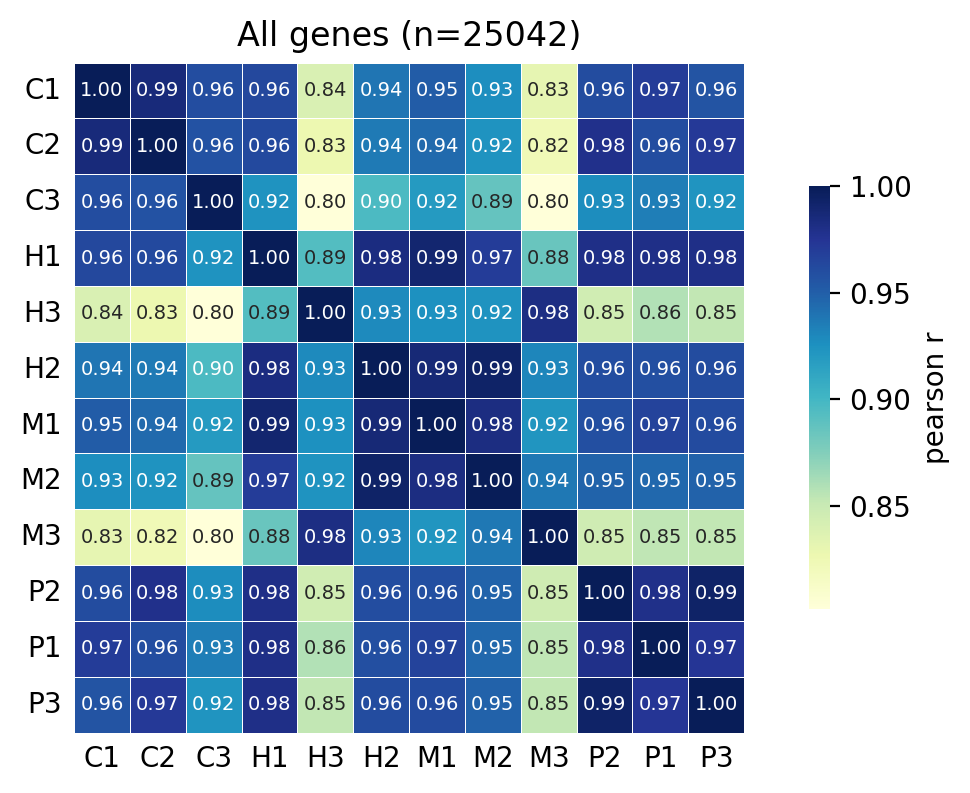

In [44]:
df = gdata.to_df().T
# df = gdata[:, g2m_unique].copy()
# df = df.to_df().T
print(df.shape)

n_genes = df.shape[0]

clusters = df.columns
n = len(clusters)

corrs = np.zeros((n, n))
ps = np.zeros((n, n))

for i, cond1 in enumerate(clusters):
    for j, cond2 in enumerate(clusters):
        corr, pval = pearsonr(df[cond1], df[cond2])
        corrs[i, j] = corr
        ps[i, j] = pval


corr_df = pd.DataFrame(corrs, index=clusters, columns=clusters)
pval_df = pd.DataFrame(ps, index=clusters, columns=clusters)


plt.rcParams['figure.dpi'] = 200
plt.figure(figsize=(5, 5))

sns.heatmap(
    corr_df,
    cmap='YlGnBu',
    square=True,
    annot=True,
    annot_kws={'fontsize':7},
    fmt=".2f",
    lw=0.25,
    linecolor='white',
    cbar_kws={'label':'pearson r', 'shrink': 0.45, 'pad': 0.075, 'format': '%.2f'},
)

plt.xlabel("")
plt.ylabel("")

# plt.title(f"Cell cycle genes (n={len(cc_genes)})")
# plt.title(f"G1/S genes (n={n_genes})")
# plt.title(f"G2/M genes (n={n_genes})")
plt.title(f"All genes (n={n_genes})")

ax = plt.gca()
ax.set_yticklabels(clusters, rotation=0, fontsize=10)
ax.set_xticklabels(clusters, fontsize=10)
ax.tick_params(axis='both', pad=1, bottom=False, left=False)

plt.tight_layout()
plt.show()

# Gene scores

In [71]:
fpath = "../../resources/genes_for_scoring.csv"

df = pd.read_csv(fpath)
print(df.shape)
print(df.columns.tolist())
df.head()

qui_genes = [gene for gene in df['quiescence'].unique() if gene in adata.var_names]
print(len(qui_genes))

(512, 18)
['G1/S_transition', 'G2/M_transition', 'CC_checkpoints', 'Cell_cycle_reg', 'Pos_proliferation', 'Neg_proliferation', 'quiescence', 'AS', 'Chromatin', 'Circadian', 'Core_repro', 'NOTCH_signaling', 'Asymm_PCP', 'FOXO', 'p53_acyivity', 'DREAM/negE2F', 'senes_stress', 'sasp']
59


In [87]:
[col for col in geneset if 'skel' in col.lower()]

['Cortical Actin Cytoskeleton Organization (GO:0030866)',
 'Cortical Cytoskeleton Organization (GO:0030865)',
 'Cytoskeleton Organization (GO:0007010)',
 'Cytoskeleton-Dependent Cytokinesis (GO:0061640)',
 'Cytoskeleton-Dependent Intracellular Transport (GO:0030705)',
 'Dense Core Granule Cytoskeletal Transport (GO:0099519)',
 'Embryonic Cranial Skeleton Morphogenesis (GO:0048701)',
 'Embryonic Skeletal Joint Development (GO:0072498)',
 'Embryonic Skeletal Joint Morphogenesis (GO:0060272)',
 'Embryonic Skeletal System Development (GO:0048706)',
 'Embryonic Skeletal System Morphogenesis (GO:0048704)',
 'Microtubule Cytoskeleton Organization Involved in Mitosis (GO:1902850)',
 'Negative Regulation of Cytoskeleton Organization (GO:0051494)',
 'Negative Regulation of Skeletal Muscle Cell Differentiation (GO:2001015)',
 'Positive Regulation of Cytoskeleton Organization (GO:0051495)',
 'Positive Regulation of Skeletal Muscle Cell Differentiation (GO:2001016)',
 'Positive Regulation of Skelet

In [88]:
g0_to_g1 = geneset['Regulation of G0 to G1 Transition (GO:0070316)'].dropna().unique()
print(len(g0_to_g1))

g1_checkpoint = geneset['Mitotic G1 DNA Damage Checkpoint Signaling (GO:0031571)'].dropna().unique()
print(len(g1_checkpoint))

g2_checkpoint = geneset['Mitotic G2 DNA Damage Checkpoint Signaling (GO:0007095)'].dropna().unique()
print(len(g2_checkpoint))

pos_skel = geneset['Regulation of Skeletal Muscle Cell Differentiation (GO:2001014)'].dropna().unique()
print(len(pos_skel))

jnk = geneset['Positive Regulation of JNK Cascade (GO:0046330)'].dropna().unique()
print(len(jnk))

p38mapk = geneset['Positive Regulation of p38MAPK Cascade (GO:1900745)'].dropna().unique()
print(len(p38mapk))

tgfb = geneset['Regulation of Transforming Growth Factor Beta Receptor Signaling Pathway (GO:0017015)'].dropna().unique()
print(len(tgfb))

pos_notch = geneset['Positive Regulation of Notch Signaling Pathway (GO:0045747)'].dropna().unique()
print(len(pos_notch))

33
13
30
8
81
22
120
33


In [89]:
categories = {
    'g0_to_g1': g0_to_g1,
    'quiescence': qui_genes,
    'g1_checkpoint': g1_checkpoint,
    'g2_checkpoint': g2_checkpoint,
    'pos_skel': pos_skel,
    'JNK': jnk,
    'p38MAPK': p38mapk,
    'TGFB': tgfb,
    'pos_NOTCH': pos_notch,
}

for key, gene_list in categories.items():
    print(f"N genes for {key}: {len(gene_list)}")
    
# make into a dataframe
cleaned_categories = {k: list(np.ravel(v)) for k, v in categories.items()}
max_len = max(len(v) for v in cleaned_categories.values())
padded = {k: v + [None] * (max_len - len(v)) for k, v in cleaned_categories.items()}

cdf = pd.DataFrame(padded)
cdf.head()

N genes for g0_to_g1: 33
N genes for quiescence: 59
N genes for g1_checkpoint: 13
N genes for g2_checkpoint: 30
N genes for pos_skel: 8
N genes for JNK: 81
N genes for p38MAPK: 22
N genes for TGFB: 120
N genes for pos_NOTCH: 33


,g0_to_g1,quiescence,g1_checkpoint,g2_checkpoint,pos_skel,JNK,p38MAPK,TGFB,pos_NOTCH
0,SMARCC1,ATF3,CDPF1,PLK1,DDX17,EDN1,MAP3K4,ADISSP,NANOS3
1,SMARCC2,ATF4,PRKDC,CDPF1,DDX5,CCL21,SPI1,GDF15,JAG1
2,CDKN2B,CTNNB1,RPS27L,DONSON,MEF2C,UNC5CL,GADD45B,CIDEA,JAG2
3,PBRM1,BACH2,TRIAP1,FOXN3,MYOCD,CARD9,GADD45A,HIPK2,PRKCI
4,PHF10,JUN,DGKZ,TICRR,UQCC2,TNFRSF19,SPHK1,SOX11,TGFB2


Skipping g0_to_g1, scores already exist.
Skipping quiescence, scores already exist.
Skipping g1_checkpoint, scores already exist.
Skipping g2_checkpoint, scores already exist.
Skipping pos_skel, scores already exist.
Skipping JNK, scores already exist.
Skipping p38MAPK, scores already exist.
Skipping TGFB, scores already exist.
Skipping pos_NOTCH, scores already exist.
Finished.
11


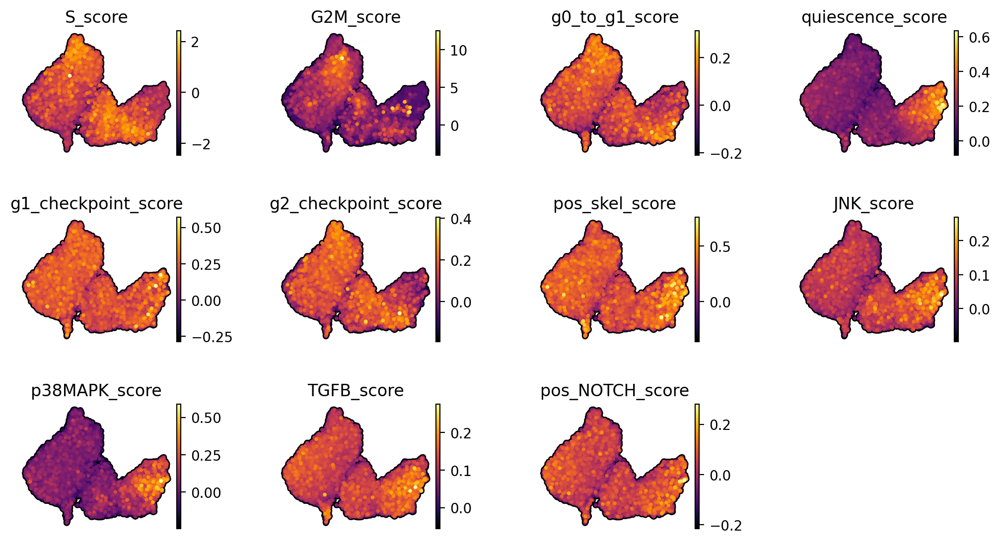

In [91]:
min_ctrl_size = 500

for geneset in cdf.columns:    
    
    score_name = f"{geneset}_score"
    
    # Skip if scores already exist
    if score_name in adata.obs.columns:
        print(f"Skipping {geneset}, scores already exist.")
        continue
        
    # get all genes belonging to geneset
    all_gene_list = cdf[geneset].unique()
    all_gene_list = [gene for gene in all_gene_list if gene in adata.var_names]
    
    # Set the ctrl_size to either 500 or the length of the gene list (whichever is larger)
    all_ctrl_size = max(min_ctrl_size, len(all_gene_list)) 
    
    # Score ALL genes in geneset
    sc.tl.score_genes(
        adata,
        gene_list=all_gene_list,
        score_name=score_name,
        ctrl_size=all_ctrl_size,
        use_raw=False,
        layer='log_norm',
    )

print("Finished.")

# scores_to_plot = [col for col in adata.obs if col.startswith('DE')] + [col for col in adata.obs if col.startswith('All')]
scores_to_plot = [col for col in adata.obs if col.endswith('_score')]
print(len(scores_to_plot))

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 2, 2

sc.pl.umap(
    adata,
    color=scores_to_plot,
    size=30,
    ncols=4,
    add_outline=True,
    outline_color=('k', 'k'),
    color_map='inferno',
    frameon=False,
    alpha=1,
    show=True,
    hspace=0.5,
    wspace=0.5,
)